In [1]:
import math
import collections
import urllib

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as pp

%matplotlib inline

In [3]:
urllib.request.urlretrieve('https://www1.ncdc.noaa.gov/pub/data/ghcn/daily/readme.txt','readme.txt')

('readme.txt', <http.client.HTTPMessage at 0x7f92069e3be0>)

In [4]:
urllib.request.urlretrieve('https://www1.ncdc.noaa.gov/pub/data/ghcn/daily/ghcnd-stations.txt','stations.txt')

('stations.txt', <http.client.HTTPMessage at 0x7f92069e3280>)

In [24]:
urllib.request.urlretrieve('https://www1.ncdc.noaa.gov/pub/data/ghcn/daily/ghcnd-countries.txt','countries.txt')

('countries.txt', <http.client.HTTPMessage at 0x7f920619aa90>)

IV. FORMAT OF "ghcnd-stations.txt"<br>
<br>
------------------------------<br>
Variable   Columns   Type<br>
------------------------------<br>
ID            1-11   Character<br>
LATITUDE     13-20   Real<br>
LONGITUDE    22-30   Real<br>
ELEVATION    32-37   Real<br>
STATE        39-40   Character<br>
NAME         42-71   Character<br>
GSN FLAG     73-75   Character<br>
HCN/CRN FLAG 77-79   Character<br>
WMO ID       81-85   Character<br>

In [9]:
stations = np.genfromtxt('stations.txt', delimiter=[11,9,10,7,3,31,4,4,6], names=['id','latitude','longitude','elevation','state','name','gsn','hcn','wmo'], dtype=['U11','d','d','d','U3','U31','U4','U4','U6'], autostrip=True)

In [10]:
len(stations)

115082

In [11]:
stations

array([('ACW00011604',  17.1167, -61.7833,   10.1, '', 'ST JOHNS COOLIDGE FLD', '', '', ''),
       ('ACW00011647',  17.1333, -61.7833,   19.2, '', 'ST JOHNS', '', '', ''),
       ('AE000041196',  25.333 ,  55.517 ,   34. , '', 'SHARJAH INTER. AIRP', 'GSN', '', '41196'),
       ...,
       ('ZI000067977', -21.017 ,  31.583 ,  430. , '', 'BUFFALO RANGE', '', '', '67977'),
       ('ZI000067983', -20.2   ,  32.616 , 1132. , '', 'CHIPINGE', 'GSN', '', '67983'),
       ('ZI000067991', -22.217 ,  30.    ,  457. , '', 'BEITBRIDGE', '', '', '67991')],
      dtype=[('id', '<U11'), ('latitude', '<f8'), ('longitude', '<f8'), ('elevation', '<f8'), ('state', '<U3'), ('name', '<U31'), ('gsn', '<U4'), ('hcn', '<U4'), ('wmo', '<U6')])

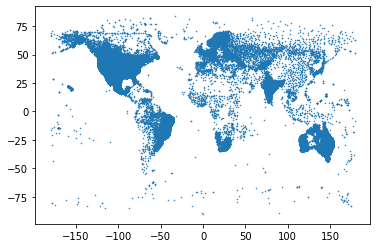

In [12]:
pp.plot(stations['longitude'], stations['latitude'], '.', markersize=1)

In [40]:
stations_ru = stations[np.char.find(stations['id'], 'RS') == 0] # to find a supstring 0 - at the beginning -1 for not in string

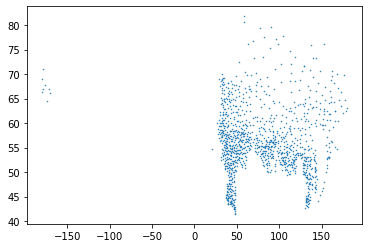

In [41]:
pp.plot(stations_ru['longitude'], stations_ru['latitude'], '.', markersize=1)

In [42]:
stations_ca = stations[stations['state'] == 'CA']

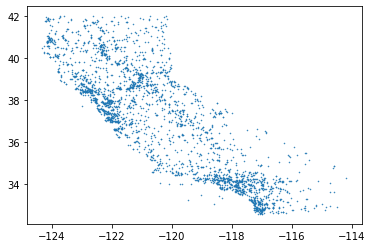

In [43]:
pp.plot(stations_ca['longitude'], stations_ca['latitude'], '.', markersize=1)

In [44]:
stations[stations['name'] == 'PASADENA']

array([('USC00046719', 34.1483, -118.1447, 263.3, 'CA', 'PASADENA', '', 'HCN', '')],
      dtype=[('id', '<U11'), ('latitude', '<f8'), ('longitude', '<f8'), ('elevation', '<f8'), ('state', '<U3'), ('name', '<U31'), ('gsn', '<U4'), ('hcn', '<U4'), ('wmo', '<U6')])

In [45]:
stations[np.char.find(stations['name'], 'PASADENA') == 0]

array([('CA1NL000026', 49.0094,  -57.5849,  52.4, 'NL', 'PASADENA 0.5 SE', '', '', ''),
       ('US1CALA0036', 34.1392, -118.1161, 225.2, 'CA', 'PASADENA 2.0 SE', '', '', ''),
       ('US1CALA0043', 34.1619, -118.1073, 277.7, 'CA', 'PASADENA 1.8 E', '', '', ''),
       ('US1CALA0091', 34.1648, -118.1249, 289. , 'CA', 'PASADENA 0.8 ENE', '', '', ''),
       ('US1MDAA0010', 39.1038,  -76.5443,  13.1, 'MD', 'PASADENA 0.7 SE', '', '', ''),
       ('US1MDAA0013', 39.1263,  -76.5596,  18.9, 'MD', 'PASADENA 1.1 NNW', '', '', ''),
       ('US1MDAA0039', 39.0916,  -76.5112,  10.7, 'MD', 'PASADENA 2.6 ESE', '', '', ''),
       ('US1TXHRR076', 29.6471,  -95.1895,  10.7, 'TX', 'PASADENA 2.4 WSW', '', '', ''),
       ('US1TXHRR084', 29.6339,  -95.1881,  11.9, 'TX', 'PASADENA 2.8 SW', '', '', ''),
       ('US1TXHRR093', 29.6849,  -95.2197,   9.1, 'TX', 'PASADENA 4.4 WNW', '', '', ''),
       ('US1TXHRR094', 29.6746,  -95.2104,   9.1, 'TX', 'PASADENA 3.6 WNW', '', '', ''),
       ('USC00046719', 34.1

In [46]:
stations[np.char.find(stations['id'], 'RS') == 0]

array([('RS000027891', 53.967 ,  48.8   ,   61. , '', 'SENGILEJ', '', '', '27890'),
       ('RS000032158', 46.633 , 142.85  ,   34. , '', 'KORSAKOV', '', '', '32156'),
       ('RS000034561', 48.67  ,  44.45  ,   28. , '', 'VOLSHSKIY GMO', '', '', '34560'),
       ...,
       ('RSM00037597', 41.667 ,  48.15  ,  477. , '', 'KASUMKENT', '', '', '37597'),
       ('RSM00037663', 41.47  ,  47.7294, 1047. , '', 'AKHTY', '', '', '37663'),
       ('RSW00037201', 71.5856, 128.9158,    9.1, 'SA', 'TIKSI 4 SSE', '', 'CRN', '')],
      dtype=[('id', '<U11'), ('latitude', '<f8'), ('longitude', '<f8'), ('elevation', '<f8'), ('state', '<U3'), ('name', '<U31'), ('gsn', '<U4'), ('hcn', '<U4'), ('wmo', '<U6')])

In [55]:
stations[np.char.find(stations['name'], 'MOSCOW') == 0]

array([('RSM00027612', 55.8331,   37.6167, 156. , '', 'MOSCOW', 'GSN', '', '27612'),
       ('US1IDLT0001', 46.7544, -117.0005, 823. , 'ID', 'MOSCOW 1.7 N', '', '', ''),
       ('US1IDLT0002', 46.7476, -116.9958, 792.5, 'ID', 'MOSCOW 1.2 N', '', '', ''),
       ('US1IDLT0003', 46.7168, -117.0153, 803.1, 'ID', 'MOSCOW 1.3 SW', '', '', ''),
       ('US1IDLT0004', 46.7762, -116.857 , 949.8, 'ID', 'MOSCOW 7.3 ENE', '', '', ''),
       ('US1IDLT0007', 46.7288, -116.9729, 802.8, 'ID', 'MOSCOW 1.1 E', '', '', ''),
       ('US1KSSV0019', 37.3239, -101.2081, 932.4, 'KS', 'MOSCOW 0.1 SW', '', '', ''),
       ('US1KSSV0020', 37.3236, -101.2064, 932.7, 'KS', 'MOSCOW 0.1 S', '', '', ''),
       ('US1KSSW0004', 37.2718, -101.0434, 901.9, 'KS', 'MOSCOW 9.7 ESE', '', '', ''),
       ('US1MIHL0006', 42.0611,  -84.497 , 332.5, 'MI', 'MOSCOW 1.0 NE', '', '', ''),
       ('US1PALC0007', 41.3772,  -75.5364, 467.6, 'PA', 'MOSCOW 2.6 N', '', '', ''),
       ('US1PALC0014', 41.33  ,  -75.57  , 520. , 'PA', 'M

In [57]:
urllib.request.urlretrieve('https://www1.ncdc.noaa.gov/pub/data/ghcn/daily/all/RSM00027612.dly','moscow.dly')

('moscow.dly', <http.client.HTTPMessage at 0x7f91ad5339d0>)

In [59]:
import getweather

In [60]:
help(getweather.getyear)

Help on function getyear in module getweather:

getyear(station_name, elements, year)
    Make a NumPy record array of length 365, containing weather data
    at station_name for the list of requested elements (TMIN/TMAX/PRCP/SNOW),
    restricted to year.
    
    If station_name is not in the list, find a station that _begins_
    with station_name, but give precedence to HCN and GSN stations.

